In [8]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split
import numpy as np
from PIL import Image
import time

class DOCResNet18(nn.Module):
    def __init__(self, num_classes):
        super(DOCResNet18, self).__init__()
        self.resnet = models.resnet18(pretrained=True)
        num_features = self.resnet.fc.in_features
        self.resnet.fc = nn.Linear(num_features, num_classes)
        self.losses = []

    def forward(self, x):
        return self.resnet(x)

class CompactnessLoss(nn.Module):
    def __init__(self):
        super(CompactnessLoss, self).__init__()
    
    def forward(self, x):
        # n is the batch size, k is the number of features
        n, k = x.size()
        means = x.mean(dim=0, keepdim=True)
        squared_diff = (x - means).pow(2)
        variance = squared_diff.sum() / (n * k)
        return variance

class DOCDataset(Dataset):
    def __init__(self, data, transform=None):
        self.data = data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        signal, label = self.data[idx]

        if isinstance(signal, np.ndarray):
            if signal.ndim == 3:
                signal = Image.fromarray(signal.astype(np.uint8), mode='RGB')
            elif signal.ndim == 2:
                signal = Image.fromarray(signal.astype(np.uint8), mode='L')
            else:
                raise TypeError(f"Unexpected shape {signal.shape} for input data")

        if self.transform:
            signal = self.transform(signal)

        return signal, label

def train_doc(model, reference_loader, target_loader, num_epochs, learning_rate, lambda_val):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    ce_loss = nn.CrossEntropyLoss()
    compactness_loss = CompactnessLoss()

    for epoch in range(num_epochs):
        model.losses.append([])
        model.train()
        desc_loss_accum = comp_loss_accum = 0.0
        
        for (ref_inputs, ref_labels), (target_inputs, _) in zip(reference_loader, target_loader):
            ref_inputs, ref_labels = ref_inputs.to(device), ref_labels.to(device)
            target_inputs = target_inputs.to(device)

            # Reference dataset forward pass
            optimizer.zero_grad()
            ref_outputs = model(ref_inputs)
            print("ref_labels:",ref_labels,len(ref_labels))
            print("ref_outputs:",ref_outputs,len(ref_outputs))
            desc_loss = ce_loss(ref_outputs, ref_labels)
            desc_loss.backward()
            desc_grads = [p.grad.clone() for p in model.parameters()]

            desc_loss_accum += desc_loss.item()

            # Target dataset forward pass
            optimizer.zero_grad()
            target_outputs = model(target_inputs)
            # variance of the target outputs is computed as (1/n*k) * sum((x - mean)^2)
            comp_loss = compactness_loss.forward(target_outputs)
            comp_loss.backward()
            comp_grads = [p.grad.clone() for p in model.parameters()]

            comp_loss_accum += comp_loss.item()

            # get the resulting gradients as the average of the two gradients:
            for p, dg, cg in zip(model.parameters(), desc_grads, comp_grads):
                p.grad = (dg + cg) / 2

            optimizer.step()
            model.losses[-1].append((desc_loss.item(),comp_loss.item()))
        print(f"Epoch [{epoch+1}/{num_epochs}], Descriptive Loss: {desc_loss_accum:.4f}, Compactness Loss: {comp_loss_accum:.4f}")

num_classes = 1000  # number of classes in ImageNet
model = DOCResNet18(num_classes)

# datasets: legitimate, reconstructed, attack, augmented legitimate signals
dataset_type = ['constellation/','fft/']
datasets_directory = '../datasets/' + dataset_type[1]

print("Dataset type:", dataset_type[1][:-1])
print("Loading datasets...")

with open(datasets_directory + 'reconstructed.npy','rb') as f:
    reconstructed_attack = []
    signal = np.load(f)
    while True:
        try:
            signal = np.load(f)
            reconstructed_attack.append(signal)
        except:
            break

with open(datasets_directory + 'legitimate.npy','rb') as f:
    legitimate = []
    signal = np.load(f)
    while True:
        try:
            signal = np.load(f)
            legitimate.append(signal)
        except:
            break

with open(datasets_directory + 'attack1.npy','rb') as f:
    attack1 = []
    while True:
        try:
            signal = np.load(f) 
            attack1.append(signal)
        except:
            break

with open(datasets_directory + 'attack2.npy','rb') as f:
    attack2 = []
    while True:
        try:
            signal = np.load(f)
            attack2.append(signal)
        except:
            break

with open(datasets_directory + 'augmented_legitimate.npy','rb') as f:
    augmented_legitimate = []
    while True:
        try:
            signal = np.load(f)
            augmented_legitimate.append(signal)
        except:
            break
legitimate = [(signal, 0) for signal in legitimate]
augmented_legitimate = [(signal, 0) for signal in augmented_legitimate]
reconstructed_attack = [(signal, 1) for signal in reconstructed_attack]
attack1 = [(signal, 1) for signal in attack1]
attack2 = [(signal, 1) for signal in attack2]
reference_dataset = augmented_legitimate + reconstructed_attack
target_dataset = augmented_legitimate

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

reference_dataset = DOCDataset(reference_dataset, transform=transform)
reference_loader = DataLoader(reference_dataset, batch_size=32, shuffle=True)

target_dataset = DOCDataset(target_dataset, transform=transform)
target_loader = DataLoader(target_dataset, batch_size=32, shuffle=True)

num_epochs = 50
learning_rate = 0.0001
lambda_val = 0.5 

print("dataset size:",len(reference_dataset),len(target_dataset))

start = time.time()
train_doc(model, reference_loader, target_loader, num_epochs, learning_rate, lambda_val)
print("training runtime:",time.time()-start)

/Users/aryannath/Important/RF/rf_signals/recordings_real/honda/.conda/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/aryannath/Important/RF/rf_signals/recordings_real/honda/.conda/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Dataset type: fft
Loading datasets...
dataset size: 398 200
ref_labels: tensor([0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0,
        0, 0, 0, 0, 1, 0, 0, 0]) 32
ref_outputs: tensor([[ 0.2414,  0.2473, -0.0278,  ..., -0.8622, -0.3665, -0.5734],
        [-0.0891,  0.1552, -0.2959,  ..., -0.8685, -0.3751, -0.3684],
        [-0.3205, -0.3434, -0.3416,  ..., -1.1839, -0.1204, -0.8309],
        ...,
        [ 0.3659,  0.1698, -0.0775,  ..., -0.7254, -0.1806, -0.4095],
        [ 0.0285,  0.5069, -0.2633,  ..., -0.9088, -0.5149, -0.4413],
        [ 0.4132,  0.2327, -0.1444,  ..., -0.7140, -0.4778, -0.5640]],
       grad_fn=<AddmmBackward0>) 32
ref_labels: tensor([0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1,
        0, 1, 0, 1, 0, 1, 0, 0]) 32
ref_outputs: tensor([[ 0.6584, -0.3235, -0.1502,  ..., -1.0297, -0.2893, -0.7004],
        [ 1.1661, -0.5087, -0.1201,  ..., -1.1834, -0.3547, -0.6875],
        [ 1.1339, -0.7282, -0.1630,  ..., -1.517

KeyboardInterrupt: 

In [4]:
reference_loader.dataset[0][1]

0

In [6]:
%cd ..

/Users/aryannath/Important/RF/Anima


In [ ]:
# import pickle

# with open('resnet_fft.pkl','rb') as f:
#     model = pickle.load(f)

# print(model.losses)

[[(6.749261856079102, 0.02478872612118721), (5.774289608001709, 0.024771617725491524), (4.9982991218566895, 0.026510749012231827), (4.07670259475708, 0.02434815652668476), (3.5874266624450684, 0.025211934000253677), (3.185875177383423, 0.04217548295855522), (2.4088480472564697, 0.06822337210178375)], [(1.9344534873962402, 0.062379609793424606), (2.1485435962677, 0.03656049072742462), (2.038494348526001, 0.0335000678896904), (1.3138853311538696, 0.03154126554727554), (0.9319172501564026, 0.028945358470082283), (0.741273820400238, 0.027646085247397423), (0.6308625340461731, 0.033595167100429535)], [(0.7417261600494385, 0.03065512143075466), (0.3996049165725708, 0.03591086342930794), (0.3460209369659424, 0.036568786948919296), (0.34045663475990295, 0.02039792202413082), (0.29556167125701904, 0.01612032949924469), (0.23032721877098083, 0.015776226297020912), (0.22338303923606873, 0.02367553673684597)], [(0.2174805998802185, 0.01324823684990406), (0.15470466017723083, 0.011830473318696022),

In [ ]:
# traced_model = torch.jit.script(model)
# traced_model.save("resnet_fft.pt")

In [25]:
import torch

model = torch.jit.load("resnet_fft.pt")

In [30]:
import pickle

with open('resnet_constellation.pkl','rb') as f:
    model = pickle.load(f)

In [31]:
def outputs_doc(model, test_loader):
    print("Getting model outputs...")
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.eval()

    all_outputs = []

    with torch.no_grad():
        for ref_inputs, _ in test_loader:
            ref_inputs = ref_inputs.to(device)
            ref_outputs = model(ref_inputs)
            all_outputs.append(ref_outputs.cpu())

    return all_outputs[0]

legitimate_dataset = DOCDataset(legitimate, transform=transform)
legitimate_loader = DataLoader(legitimate_dataset, batch_size=len(legitimate_dataset), shuffle=False)
legitimate_outputs = outputs_doc(model, legitimate_loader)
print("legitimate outputs:",len(legitimate_outputs))
augmented_legitimate_loader = DataLoader(target_dataset, batch_size=len(target_dataset), shuffle=False)
augmented_legitimate_outputs = outputs_doc(model, augmented_legitimate_loader)
print("augmented legitimate outputs:",len(augmented_legitimate_outputs))
attack1_dataset = DOCDataset(attack1, transform=transform)
attack1_loader = DataLoader(attack1_dataset, batch_size=len(attack1_dataset), shuffle=False)
attack1_outputs = outputs_doc(model, attack1_loader)
print("HackRF One (1) outputs:",len(attack1_outputs))
attack2_dataset = DOCDataset(attack2, transform=transform)
attack2_loader = DataLoader(attack2_dataset, batch_size=len(attack2_dataset), shuffle=False)
attack2_outputs = outputs_doc(model, attack2_loader)
print("HackRF One (2) outputs:",len(attack2_outputs))

Getting model outputs...
legitimate outputs: 98
Getting model outputs...
augmented legitimate outputs: 200
Getting model outputs...
HackRF One (1) outputs: 100
Getting model outputs...
HackRF One (2) outputs: 100


In [27]:
print(legitimate_outputs[0],len(legitimate_outputs[0]))

tensor([ 9.6538, -2.3322, -2.3794, -1.6745, -2.6386, -1.6076, -2.4823, -2.6245,
        -1.3845, -2.1407, -2.2174, -1.5927, -1.5723, -1.7256, -2.3302, -2.0117,
        -2.4021, -2.0019, -2.1813, -1.9789, -2.5230, -2.0789, -2.7246, -0.6678,
        -2.0278, -2.4581, -2.4492, -1.8457, -2.1711, -0.9639, -1.8784, -1.0335,
        -1.7414, -1.8027, -1.6550, -1.4312, -2.6568, -2.0223, -1.9141, -2.3035,
        -1.0728, -2.2430, -2.6987, -2.4696, -1.5879, -1.9028, -1.4609, -2.0099,
        -1.7199, -1.6136, -1.2240, -1.3880, -3.1954, -2.6974, -3.2844, -3.4253,
        -2.2191, -1.9730, -2.3942, -1.3731, -2.2662, -2.8290, -1.7440, -2.8552,
        -1.7286, -1.7477, -2.3821, -1.6824, -1.9022, -2.1471, -2.0039, -2.4349,
        -1.7466, -1.5246, -2.0455, -2.0132, -1.9844, -2.1326, -0.8035, -2.8399,
        -2.1217, -1.3576, -1.6962, -1.7718, -1.4678, -1.8379, -1.1657, -1.7314,
        -2.1513, -2.6849, -1.7346, -2.2799, -1.4524, -0.9850, -1.7314, -3.3254,
        -2.4337, -2.4384, -1.6843, -2.20

In [28]:
legitimate_outputs.shape

torch.Size([98, 1000])

### FFT Dataset

Results without any proprocessing of the data

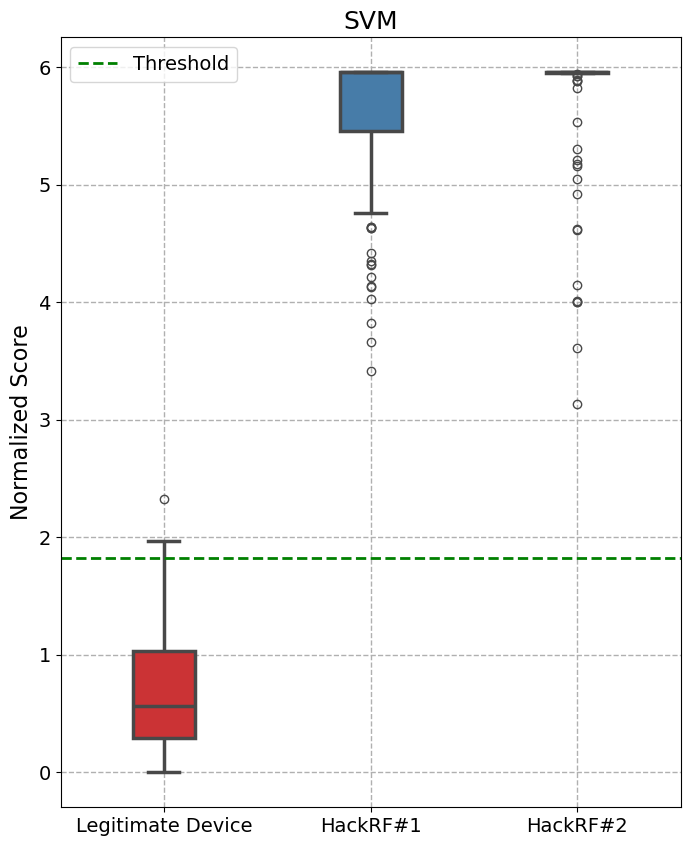

Classification Report for SVM
              precision    recall  f1-score   support

  Legitimate       1.00      0.95      0.97        98
      Attack       0.98      1.00      0.99       200

    accuracy                           0.98       298
   macro avg       0.99      0.97      0.98       298
weighted avg       0.98      0.98      0.98       298



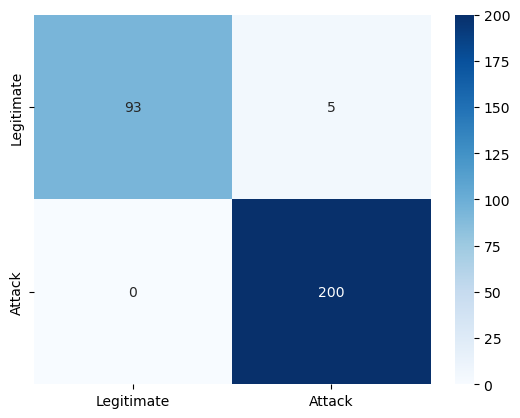

In [49]:
# One class SVM
import numpy as np
from sklearn import svm
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

scaler = StandardScaler()

def train_svm_and_get_scores(X_train, X_test):
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    clf = svm.OneClassSVM(kernel='rbf',nu=0.1)
    clf.fit(X_train)
    scores = clf.decision_function(X_test)
    return scores

X_train, X_test = train_test_split(augmented_legitimate_outputs, test_size=0.3, random_state=42)

aug_legitimate_scores = train_svm_and_get_scores(X_train, X_test)

mu = np.mean(aug_legitimate_scores)
sigma = np.std(aug_legitimate_scores)

legitimate_scores = train_svm_and_get_scores(X_train, legitimate_outputs)

legitimate_scores_norm = np.abs((legitimate_scores - mu) / sigma)

thresholdsvm = np.percentile(legitimate_scores_norm, 95)
legitimate_predictions = (legitimate_scores_norm > thresholdsvm).astype(int)

def evaluate_attack_outputs(attack_outputs, device_name):
    scores = train_svm_and_get_scores(X_train, attack_outputs)
    scores_norm = np.abs((scores - mu) / sigma)
    predictions = (scores_norm > thresholdsvm).astype(int)
    y_test = np.ones(len(attack_outputs))  # True labels for attack outputs
    return scores_norm, predictions, y_test

hackrf1_scores, svmhackrf1_pred, hackrf1_true = evaluate_attack_outputs(attack1_outputs, 'HackRF1')
hackrf2_scores, svmhackrf2_pred, hackrf2_true = evaluate_attack_outputs(attack2_outputs, 'HackRF2')

combined_predictions = np.concatenate([legitimate_predictions,svmhackrf1_pred, svmhackrf2_pred])
true_labels = np.concatenate([np.zeros_like(legitimate_predictions), hackrf1_true, hackrf2_true])

plot_data = [
    legitimate_scores_norm,
    hackrf1_scores,
    hackrf2_scores
]

plt.figure(figsize=(8, 10))
colors = sns.color_palette("Set1", n_colors=3)

sns.boxplot(data=plot_data, width=0.3, palette=colors, linewidth=2.5)
plt.axhline(y=thresholdsvm, color='g', linestyle='--', linewidth=2, label='Threshold')
plt.xticks([0, 1, 2], ['Legitimate Device', 'HackRF#1', 'HackRF#2'], fontsize=14)
plt.yticks(fontsize=14)
plt.ylabel('Normalized Score', fontsize=16)
plt.title('SVM', fontsize=18)
plt.legend(fontsize=14)
plt.grid(True, linestyle='--', linewidth=1)
plt.show()

print("Classification Report for SVM")
print(classification_report(true_labels, combined_predictions, target_names=['Legitimate', 'Attack']))

cm = confusion_matrix(true_labels, combined_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Legitimate', 'Attack'], yticklabels=['Legitimate', 'Attack'])


X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
clf = svm.OneClassSVM(kernel='rbf',nu=0.1)
clf.fit(X_train)
scores = clf.decision_function(X_test)

<Figure size 800x1000 with 0 Axes>

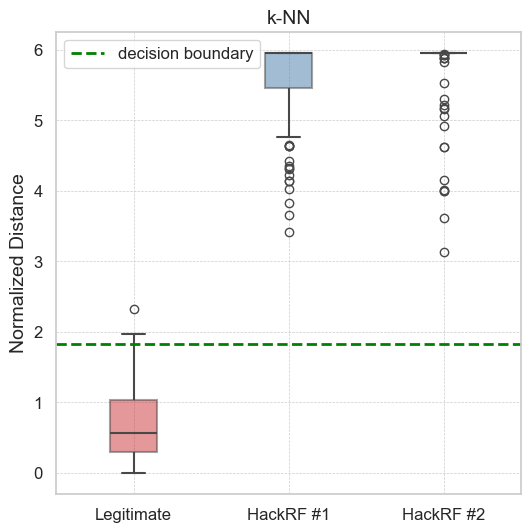

Classification Report for SVM
              precision    recall  f1-score   support

  Legitimate       1.00      0.95      0.97        98
      Attack       0.98      1.00      0.99       200

    accuracy                           0.98       298
   macro avg       0.99      0.97      0.98       298
weighted avg       0.98      0.98      0.98       298



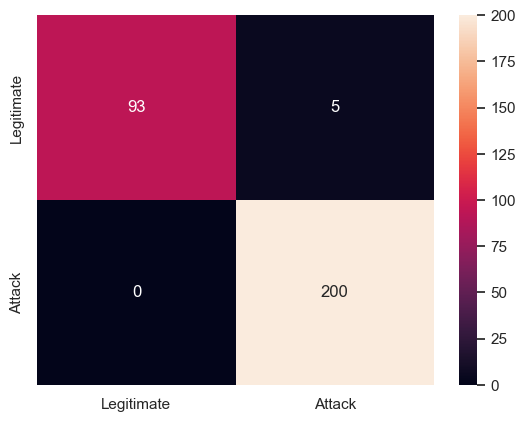

In [29]:
# One class SVM
import numpy as np
from sklearn import svm
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

scaler = StandardScaler()

def train_svm_and_get_scores(X_train, X_test):
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    clf = svm.OneClassSVM(kernel='rbf',nu=0.1)
    clf.fit(X_train)
    scores = clf.decision_function(X_test)
    return scores

X_train, X_test = train_test_split(augmented_legitimate_outputs, test_size=0.3, random_state=42)

aug_legitimate_scores = train_svm_and_get_scores(X_train, X_test)

mu = np.mean(aug_legitimate_scores)
sigma = np.std(aug_legitimate_scores)

legitimate_scores = train_svm_and_get_scores(X_train, legitimate_outputs)

legitimate_scores_norm = np.abs((legitimate_scores - mu) / sigma)

thresholdsvm = np.percentile(legitimate_scores_norm, 95)
legitimate_predictions = (legitimate_scores_norm > thresholdsvm).astype(int)

def evaluate_attack_outputs(attack_outputs, device_name):
    scores = train_svm_and_get_scores(X_train, attack_outputs)
    scores_norm = np.abs((scores - mu) / sigma)
    predictions = (scores_norm > thresholdsvm).astype(int)
    y_test = np.ones(len(attack_outputs))  # True labels for attack outputs
    return scores_norm, predictions, y_test

hackrf1_scores, svmhackrf1_pred, hackrf1_true = evaluate_attack_outputs(attack1_outputs, 'HackRF1')
hackrf2_scores, svmhackrf2_pred, hackrf2_true = evaluate_attack_outputs(attack2_outputs, 'HackRF2')

combined_predictions = np.concatenate([legitimate_predictions,svmhackrf1_pred, svmhackrf2_pred])
true_labels = np.concatenate([np.zeros_like(legitimate_predictions), hackrf1_true, hackrf2_true])

plot_data = [
    legitimate_scores_norm,
    hackrf1_scores,
    hackrf2_scores
]

plt.figure(figsize=(8, 10))
colors = sns.color_palette("Set1", n_colors=3)
sns.set(style="whitegrid")
plt.figure(figsize=(6, 6))
sns.boxplot(data=plot_data, width=0.3, palette=colors, linewidth=1.5, boxprops=dict(alpha=0.5))
plt.axhline(y=thresholdsvm, color='green', linestyle='--', linewidth=2, label='decision boundary')
plt.xticks([0, 1, 2], ['Legitimate', 'HackRF #1', 'HackRF #2'], fontsize=12)
plt.yticks(fontsize=12)
plt.ylabel('Normalized Distance', fontsize=14)
plt.xlabel('')
plt.title('k-NN', fontsize=14)
plt.legend(fontsize=12, loc='best')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.minorticks_on()
plt.show()

print("Classification Report for SVM")
print(classification_report(true_labels, combined_predictions, target_names=['Legitimate', 'Attack']))

cm = confusion_matrix(true_labels, combined_predictions)
sns.heatmap(cm, annot=True, fmt='d', xticklabels=['Legitimate', 'Attack'], yticklabels=['Legitimate', 'Attack'])


X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
clf = svm.OneClassSVM(kernel='rbf',nu=0.1)
clf.fit(X_train)
scores = clf.decision_function(X_test)

Dataset type: fft
Loading datasets...
dataset size: 398 200
Epoch [1/50], Descriptive Loss: 30.7807, Compactness Loss: 0.2360
Epoch [2/50], Descriptive Loss: 9.7394, Compactness Loss: 0.2542
Epoch [3/50], Descriptive Loss: 2.5771, Compactness Loss: 0.1791
Epoch [4/50], Descriptive Loss: 0.9814, Compactness Loss: 0.0811
Epoch [5/50], Descriptive Loss: 0.6745, Compactness Loss: 0.0511
Epoch [6/50], Descriptive Loss: 0.5017, Compactness Loss: 0.0337
Epoch [7/50], Descriptive Loss: 0.3832, Compactness Loss: 0.0257
Epoch [8/50], Descriptive Loss: 0.2827, Compactness Loss: 0.0250
Epoch [9/50], Descriptive Loss: 0.2857, Compactness Loss: 0.0201
Epoch [10/50], Descriptive Loss: 0.2915, Compactness Loss: 0.0156
Epoch [11/50], Descriptive Loss: 0.2148, Compactness Loss: 0.0144
Epoch [12/50], Descriptive Loss: 0.1373, Compactness Loss: 0.0122
Epoch [13/50], Descriptive Loss: 0.1064, Compactness Loss: 0.0105
Epoch [14/50], Descriptive Loss: 0.1163, Compactness Loss: 0.0094
Epoch [15/50], Descriptive Loss: 0.1313, Compactness Loss: 0.0087
Epoch [16/50], Descriptive Loss: 0.1087, Compactness Loss: 0.0074
Epoch [17/50], Descriptive Loss: 0.1388, Compactness Loss: 0.0072
Epoch [18/50], Descriptive Loss: 0.1064, Compactness Loss: 0.0075
Epoch [19/50], Descriptive Loss: 0.2014, Compactness Loss: 0.0089
Epoch [20/50], Descriptive Loss: 0.1319, Compactness Loss: 0.0153
Epoch [21/50], Descriptive Loss: 0.0690, Compactness Loss: 0.0286
Epoch [22/50], Descriptive Loss: 0.0869, Compactness Loss: 0.0114
Epoch [23/50], Descriptive Loss: 0.0541, Compactness Loss: 0.0078
Epoch [24/50], Descriptive Loss: 0.0563, Compactness Loss: 0.0062
Epoch [25/50], Descriptive Loss: 0.0480, Compactness Loss: 0.0052
Epoch [26/50], Descriptive Loss: 0.0469, Compactness Loss: 0.0049
Epoch [27/50], Descriptive Loss: 0.0587, Compactness Loss: 0.0043
Epoch [28/50], Descriptive Loss: 0.0486, Compactness Loss: 0.0040
Epoch [29/50], Descriptive Loss: 0.0397, Compactness Loss: 0.0037
Epoch [30/50], Descriptive Loss: 0.0540, Compactness Loss: 0.0035
Epoch [31/50], Descriptive Loss: 0.0352, Compactness Loss: 0.0035
Epoch [32/50], Descriptive Loss: 0.0616, Compactness Loss: 0.0034
Epoch [33/50], Descriptive Loss: 0.0424, Compactness Loss: 0.0033
Epoch [34/50], Descriptive Loss: 0.0391, Compactness Loss: 0.0032
Epoch [35/50], Descriptive Loss: 0.0476, Compactness Loss: 0.0031
Epoch [36/50], Descriptive Loss: 0.0510, Compactness Loss: 0.0030
Epoch [37/50], Descriptive Loss: 0.1161, Compactness Loss: 0.0030
Epoch [38/50], Descriptive Loss: 0.0394, Compactness Loss: 0.0207
Epoch [39/50], Descriptive Loss: 0.0475, Compactness Loss: 0.0072
Epoch [40/50], Descriptive Loss: 0.0574, Compactness Loss: 0.0049
Epoch [41/50], Descriptive Loss: 0.0382, Compactness Loss: 0.0039
Epoch [42/50], Descriptive Loss: 0.0274, Compactness Loss: 0.0033
Epoch [43/50], Descriptive Loss: 0.0496, Compactness Loss: 0.0029
Epoch [44/50], Descriptive Loss: 0.0327, Compactness Loss: 0.0027
Epoch [45/50], Descriptive Loss: 0.0500, Compactness Loss: 0.0026
Epoch [46/50], Descriptive Loss: 0.0282, Compactness Loss: 0.0027
Epoch [47/50], Descriptive Loss: 0.0258, Compactness Loss: 0.0024
Epoch [48/50], Descriptive Loss: 0.0204, Compactness Loss: 0.0023
Epoch [49/50], Descriptive Loss: 0.0241, Compactness Loss: 0.0024
Epoch [50/50], Descriptive Loss: 0.0193, Compactness Loss: 0.0021
training runtime: 1611.0908522605896

In [ ]:
import pickle

with open('model.pkl','rb') as f:
    model = pickle.load(f)


### IQ Data Constellation Dataset

Results without any proprocessing of the data

<Figure size 800x1000 with 0 Axes>

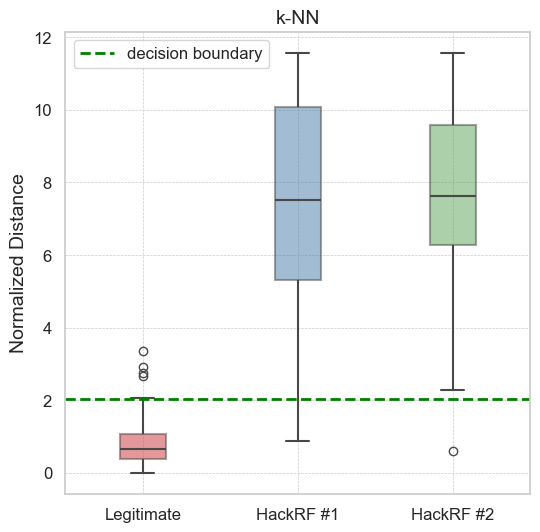

Classification Report for SVM
              precision    recall  f1-score   support

  Legitimate       0.96      0.95      0.95        98
      Attack       0.98      0.98      0.98       200

    accuracy                           0.97       298
   macro avg       0.97      0.96      0.97       298
weighted avg       0.97      0.97      0.97       298



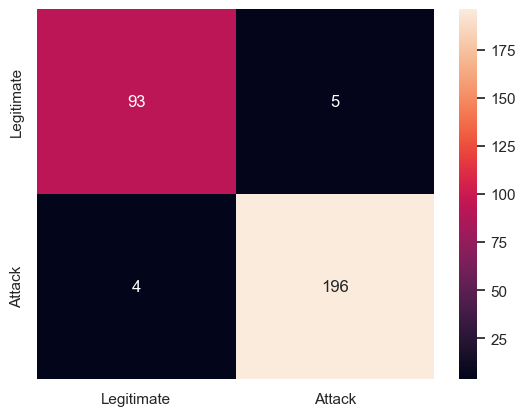

In [32]:
# One class SVM
import numpy as np
from sklearn import svm
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

scaler = StandardScaler()

def train_svm_and_get_scores(X_train, X_test):
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    clf = svm.OneClassSVM(kernel='rbf',nu=0.1)
    clf.fit(X_train)
    scores = clf.decision_function(X_test)
    return scores

X_train, X_test = train_test_split(augmented_legitimate_outputs, test_size=0.3, random_state=42)

aug_legitimate_scores = train_svm_and_get_scores(X_train, X_test)

mu = np.mean(aug_legitimate_scores)
sigma = np.std(aug_legitimate_scores)

legitimate_scores = train_svm_and_get_scores(X_train, legitimate_outputs)

legitimate_scores_norm = np.abs((legitimate_scores - mu) / sigma)

thresholdsvm = np.percentile(legitimate_scores_norm, 95)
legitimate_predictions = (legitimate_scores_norm > thresholdsvm).astype(int)

def evaluate_attack_outputs(attack_outputs, device_name):
    scores = train_svm_and_get_scores(X_train, attack_outputs)
    scores_norm = np.abs((scores - mu) / sigma)
    predictions = (scores_norm > thresholdsvm).astype(int)
    y_test = np.ones(len(attack_outputs))  # True labels for attack outputs
    return scores_norm, predictions, y_test

hackrf1_scores, svmhackrf1_pred, hackrf1_true = evaluate_attack_outputs(attack1_outputs, 'HackRF1')
hackrf2_scores, svmhackrf2_pred, hackrf2_true = evaluate_attack_outputs(attack2_outputs, 'HackRF2')

combined_predictions = np.concatenate([legitimate_predictions,svmhackrf1_pred, svmhackrf2_pred])
true_labels = np.concatenate([np.zeros_like(legitimate_predictions), hackrf1_true, hackrf2_true])

plot_data = [
    legitimate_scores_norm,
    hackrf1_scores,
    hackrf2_scores
]

plt.figure(figsize=(8, 10))
colors = sns.color_palette("Set1", n_colors=3)
sns.set(style="whitegrid")
plt.figure(figsize=(6, 6))
sns.boxplot(data=plot_data, width=0.3, palette=colors, linewidth=1.5, boxprops=dict(alpha=0.5))
plt.axhline(y=thresholdsvm, color='green', linestyle='--', linewidth=2, label='decision boundary')
plt.xticks([0, 1, 2], ['Legitimate', 'HackRF #1', 'HackRF #2'], fontsize=12)
plt.yticks(fontsize=12)
plt.ylabel('Normalized Distance', fontsize=14)
plt.xlabel('')
plt.title('k-NN', fontsize=14)
plt.legend(fontsize=12, loc='best')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.minorticks_on()
plt.show()

print("Classification Report for SVM")
print(classification_report(true_labels, combined_predictions, target_names=['Legitimate', 'Attack']))

cm = confusion_matrix(true_labels, combined_predictions)
sns.heatmap(cm, annot=True, fmt='d', xticklabels=['Legitimate', 'Attack'], yticklabels=['Legitimate', 'Attack'])


X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
clf = svm.OneClassSVM(kernel='rbf',nu=0.1)
clf.fit(X_train)
scores = clf.decision_function(X_test)

In [27]:
with open('svm_constellation.pkl','wb') as f:
    pickle.dump(clf,f)

In [14]:
print(combined_predictions[:len(legitimate_predictions)])
print(true_labels[:len(legitimate_predictions)])
print(len(combined_predictions),len(true_labels))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
298 298


In [18]:
import pickle

with open('resnet_constellation.pkl','wb') as f:
    pickle.dump(model,f)

### ResNet with Constellation dataset:

Dataset type: constellation

dataset size: 318 160 80 40

Training...

Epoch [1/7], Descriptive Loss: 14.7895, Compactness Loss: 0.7546

Epoch [2/7], Descriptive Loss: 1.0184, Compactness Loss: 0.2851

Epoch [3/7], Descriptive Loss: 0.4831, Compactness Loss: 0.1227

Epoch [4/7], Descriptive Loss: 0.2445, Compactness Loss: 0.0638

Epoch [5/7], Descriptive Loss: 0.1668, Compactness Loss: 0.0481

Epoch [6/7], Descriptive Loss: 0.1497, Compactness Loss: 0.0555

Epoch [7/7], Descriptive Loss: 0.0930, Compactness Loss: 0.0433

training runtime: 164.53897309303284

Testing...

Epoch [1/7], Descriptive Loss: 0.0612, Compactness Loss: 0.0179

Epoch [2/7], Descriptive Loss: 0.1637, Compactness Loss: 0.0148

Epoch [3/7], Descriptive Loss: 0.1032, Compactness Loss: 0.0119

Epoch [4/7], Descriptive Loss: 0.0569, Compactness Loss: 0.0142

Epoch [5/7], Descriptive Loss: 0.0844, Compactness Loss: 0.0181

Epoch [6/7], Descriptive Loss: 0.1064, Compactness Loss: 0.0149

Epoch [7/7], Descriptive Loss: 0.0401, Compactness Loss: 0.0120

testing runtime: 54.514583110809326

### ResNet with FFT dataset:

Dataset type: fft/

Loading datasets...

Epoch [1/10], Descriptive Loss: 18.1103, Compactness Loss: 0.2922

Epoch [2/10], Descriptive Loss: 0.1142, Compactness Loss: 0.2528

Epoch [3/10], Descriptive Loss: 0.0207, Compactness Loss: 0.0497

Epoch [4/10], Descriptive Loss: 0.0413, Compactness Loss: 0.0239

Epoch [5/10], Descriptive Loss: 0.0184, Compactness Loss: 0.0168

Epoch [6/10], Descriptive Loss: 0.0121, Compactness Loss: 0.0118

Epoch [7/10], Descriptive Loss: 0.0082, Compactness Loss: 0.0106

Epoch [8/10], Descriptive Loss: 0.0032, Compactness Loss: 0.0088

Epoch [9/10], Descriptive Loss: 0.0074, Compactness Loss: 0.0069

Epoch [10/10], Descriptive Loss: 0.0030, Compactness Loss: 0.0070

runtime: 335.7496831417084

torch.Size([3, 224, 224])


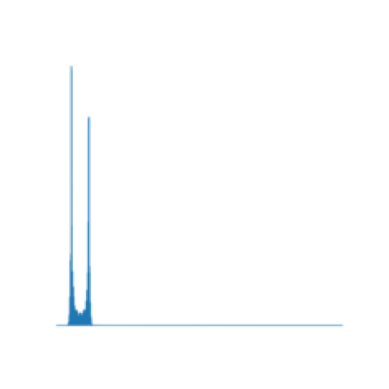

In [10]:
signal,label = reference_loader.dataset[0]
print(signal.shape)
signal = signal.permute(1, 2, 0)
signal = signal.numpy()
import matplotlib.pyplot as plt
plt.imshow(signal)
plt.axis('off')
plt.show()

torch.Size([3, 224, 224])


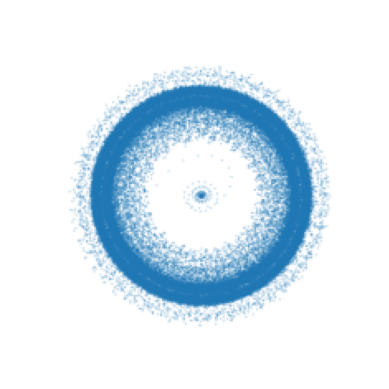

In [8]:
signal,label = reference_loader.dataset[0]
print(signal.shape)
signal = signal.permute(1, 2, 0)
signal = signal.numpy()
import matplotlib.pyplot as plt
plt.imshow(signal)
plt.axis('off')
plt.show()

In [114]:
legitimate_outputs[0]

tensor([ 8.9264,  5.6583, -5.2948, -4.6221, -5.1230, -5.1969, -4.9833, -4.9316,
        -4.5593, -5.2770, -5.3424, -4.7094, -5.1120, -5.0604, -5.4707, -5.1534,
        -4.8021, -5.3580, -4.8726, -4.4398, -5.1170, -4.9106, -5.2793, -4.3377,
        -4.8098, -5.4274, -4.1280, -4.8910, -4.9870, -5.0928, -4.7775, -4.6501,
        -5.1560, -5.2078, -4.8919, -5.3861, -5.2091, -5.1071, -5.0725, -5.2121,
        -5.0326, -4.7922, -5.1628, -4.7052, -5.2918, -4.8985, -4.8160, -4.4672,
        -4.9549, -5.0205, -5.3970, -4.3982, -5.4711, -4.5430, -5.1819, -5.3152,
        -4.6268, -4.9665, -4.9250, -5.2664, -4.0054, -4.7220, -4.5741, -4.3203,
        -5.5024, -5.2606, -4.8297, -4.6773, -5.0386, -4.9047, -4.9692, -5.0460,
        -4.7830, -4.9793, -4.6016, -5.0610, -5.2182, -5.0303, -5.0210, -4.9148,
        -4.8849, -4.8234, -4.9780, -5.4632, -4.4189, -4.5647, -5.2645, -5.1533,
        -4.6342, -4.5902, -5.1957, -4.7345, -4.5337, -5.0994, -4.9600, -5.2195,
        -5.2457, -5.0870, -5.1916, -5.23

In [2]:
# plot the correlation matrix with the legitimate and attack signals
import seaborn as sns

def plot_correlation_matrix(data, title):
    corr = np.corrcoef(data)
    sns.heatmap(corr, xticklabels=False, yticklabels=False)
    plt.title(title)
    plt.show()

combined_outputs = np.concatenate([legitimate_outputs,augmented_legitimate_outputs, attack1_outputs, attack2_outputs])

plot_correlation_matrix(combined_outputs, 'Legitimate and Attack Signals Correlation Matrix')

NameError: name 'legitimate_outputs' is not defined

In [3]:
# DO pca
from sklearn.decomposition import PCA

def plot_pca(data, title):
    pca = PCA(n_components=400)
    principal_components = pca.fit_transform(data)
    plt.scatter(principal_components[:len(legitimate_outputs), 2], principal_components[:len(legitimate_outputs), 3], label='Legitimate',s=10)
    plt.scatter(principal_components[len(legitimate_outputs):, 2], principal_components[len(legitimate_outputs):, 3], label='Attack',s=10)
    plt.title(title)
    plt.show()
    return principal_components

combined_pca = plot_pca(combined_outputs, 'PCA')
legitimate_pca = combined_pca[:len(legitimate_outputs)]
augmented_legitimate_pca = combined_pca[len(legitimate_outputs):len(augmented_legitimate_outputs)]
attack1_pca = combined_pca[len(legitimate_outputs) + len(augmented_legitimate_outputs):len(legitimate_outputs) + len(augmented_legitimate_outputs) +len(attack1_dataset)]
attack2_pca = combined_pca[len(legitimate_outputs) + len(augmented_legitimate_outputs)+len(attack1_dataset):]
print(len(legitimate_pca), len(attack1_pca), len(attack2_pca))

NameError: name 'combined_outputs' is not defined

In [4]:
# One class SVM
import numpy as np
from sklearn import svm
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

scaler = StandardScaler()

def train_svm_and_get_scores(X_train, X_test):
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    clf = svm.OneClassSVM(kernel='rbf',nu=0.04)
    clf.fit(X_train)
    scores = clf.decision_function(X_test)
    return scores

X_train, X_test = train_test_split(augmented_legitimate_pca, test_size=0.3, random_state=42)

aug_legitimate_scores = train_svm_and_get_scores(X_train, X_test)

mu = np.mean(aug_legitimate_scores)
sigma = np.std(aug_legitimate_scores)

legitimate_scores = train_svm_and_get_scores(X_train, legitimate_pca)

legitimate_scores_norm = np.abs((legitimate_scores - mu) / sigma)

thresholdsvm = np.percentile(legitimate_scores_norm, 95)
legitimate_predictions = (legitimate_scores_norm > thresholdsvm).astype(int)

def evaluate_attack_outputs(attack_outputs, device_name):
    scores = train_svm_and_get_scores(X_train, attack_outputs)
    scores_norm = np.abs((scores - mu) / sigma)
    predictions = (scores_norm > thresholdsvm).astype(int)
    y_test = np.ones(len(attack_outputs))  # True labels for attack outputs
    return scores_norm, predictions, y_test

hackrf1_scores, svmhackrf1_pred, hackrf1_true = evaluate_attack_outputs(attack1_pca, 'HackRF1')
hackrf2_scores, svmhackrf2_pred, hackrf2_true = evaluate_attack_outputs(attack2_pca, 'HackRF2')

combined_predictions = np.concatenate([legitimate_predictions,svmhackrf1_pred, svmhackrf2_pred])
true_labels = np.concatenate([np.zeros_like(legitimate_predictions), hackrf1_true, hackrf2_true])

plot_data = [
    legitimate_scores_norm,
    hackrf1_scores,
    hackrf2_scores
]

plt.figure(figsize=(8, 10))
colors = sns.color_palette("Set1", n_colors=3)

sns.boxplot(data=plot_data, width=0.3, palette=colors, linewidth=2.5)
plt.axhline(y=thresholdsvm, color='g', linestyle='--', linewidth=2, label='Threshold')
plt.xticks([0, 1, 2], ['Legitimate Device', 'HackRF#1', 'HackRF#2'], fontsize=14)
plt.yticks(fontsize=14)
plt.ylabel('Normalized Score', fontsize=16)
plt.title('SVM', fontsize=18)
plt.legend(fontsize=14)
plt.grid(True, linestyle='--', linewidth=1)
plt.show()

print("Classification Report for SVM")
print(classification_report(true_labels, combined_predictions, target_names=['Legitimate', 'Attack']))

cm = confusion_matrix(true_labels, combined_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Legitimate', 'Attack'], yticklabels=['Legitimate', 'Attack'])

NameError: name 'augmented_legitimate_pca' is not defined

### Dataset Creation

In [1]:
# datasets: legitimate, reconstructed, attack, augmented legitimate signals
import numpy as np

datasets_directory = '../datasets/signals/'

with open(datasets_directory + 'reconstructed.npy','rb') as f:
    reconstructed_attack = []
    signal = np.load(f)
    while True:
        try:
            signal = np.load(f)
            reconstructed_attack.append(signal)
        except:
            break

with open(datasets_directory + 'legitimate.npy','rb') as f:
    legitimate = []
    signal = np.load(f)
    while True:
        try:
            signal = np.load(f)
            legitimate.append(signal)
        except:
            break

with open(datasets_directory + 'attack1.npy','rb') as f:
    attack1 = []
    while True:
        try:
            signal = np.load(f)
            attack1.append(signal)
        except:
            break

with open(datasets_directory + 'attack2.npy','rb') as f:
    attack2 = []
    while True:
        try:
            signal = np.load(f)
            attack2.append(signal)
        except:
            break

with open(datasets_directory + 'augmented_legitimate.npy','rb') as f:
    augmented_legitimate = []
    while True:
        try:
            signal = np.load(f)
            augmented_legitimate.append(signal)
        except:
            break

augmented_legitimate = [(signal, 0) for signal in augmented_legitimate]
reconstructed_attack = [(signal, 1) for signal in reconstructed_attack]
attack1 = [(signal, 1) for signal in attack1]
attack2 = [(signal, 1) for signal in attack2]
legitimate = [(signal, 0) for signal in legitimate]
reference_dataset = augmented_legitimate + reconstructed_attack
target_dataset = augmented_legitimate

In [2]:
signal

array([-6.48543101e-06-2.56189306e-06j, -1.91223886e-05-3.39634792e-05j,
       -5.12657907e-05-9.05890091e-05j, ...,
        4.38015593e-01-5.66632568e-01j,  6.06857473e-01-3.79409157e-01j,
        6.97994761e-01-1.44818695e-01j])

In [ ]:
from helpers.fft_gen import gen_fft_dataset

legitimate_fft = gen_fft_dataset(legitimate)
reconstructed_attack_fft = gen_fft_dataset(reconstructed_attack)
attack1_fft = gen_fft_dataset(attack1)
attack2_fft = gen_fft_dataset(attack2)
augmented_legitimate_fft = gen_fft_dataset(augmented_legitimate)

fft_directory = '../datasets/fft/'

with open(fft_directory + 'legitimate.npy', 'wb') as f:
    for signal in legitimate_fft:
        np.save(f, signal[0])

with open(fft_directory + 'reconstructed.npy', 'wb') as f:
    for signal in reconstructed_attack_fft:
        np.save(f, signal[0])

with open(fft_directory + 'attack1.npy', 'wb') as f:
    for signal in attack1_fft:
        np.save(f, signal[0])

with open(fft_directory + 'attack2.npy', 'wb') as f:
    for signal in attack2_fft:
        np.save(f, signal[0])

with open(fft_directory + 'augmented_legitimate.npy', 'wb') as f:
    for signal in augmented_legitimate_fft:
        np.save(f, signal[0])


In [ ]:
from helpers.constellation_gen import gen_constellation_dataset
legitimate_constellation = gen_constellation_dataset(legitimate)
reconstructed_attack_constellation = gen_constellation_dataset(reconstructed_attack)
attack1_constellation = gen_constellation_dataset(attack1)
attack2_constellation = gen_constellation_dataset(attack2)
augmented_legitimate_constellation = gen_constellation_dataset(augmented_legitimate)

constellation_directory = '../datasets/constellation/'

with open(constellation_directory + 'legitimate.npy', 'wb') as f:
    for signal in legitimate_constellation:
        np.save(f, signal[0])

with open(constellation_directory + 'reconstructed.npy', 'wb') as f:
    for signal in reconstructed_attack_constellation:
        np.save(f, signal[0])

with open(constellation_directory + 'attack1.npy', 'wb') as f:
    for signal in attack1_constellation:
        np.save(f, signal[0])

with open(constellation_directory + 'attack2.npy', 'wb') as f:
    for signal in attack2_constellation:
        np.save(f, signal[0])

with open(constellation_directory + 'augmented_legitimate.npy', 'wb') as f:
    for signal in augmented_legitimate_constellation:
        np.save(f, signal[0])


In [1]:
import numpy as np
datasets_directory = '../datasets/signals/'
with open(datasets_directory + 'augmented_legitimate7.npy','rb') as f:
    augmented_legitimate = []
    while True:
        try:
            signal = np.load(f)
            augmented_legitimate.append(signal)
        except:
            break

with open(datasets_directory + 'reconstructed7.npy','rb') as f:
    reconstructed_attack = []
    signal = np.load(f)
    while True:
        try:
            signal = np.load(f)
            reconstructed_attack.append(signal)
        except:
            break
augmented_legitimate = [(signal, 0) for signal in augmented_legitimate]
reconstructed_attack = [(signal, 1) for signal in reconstructed_attack]

In [2]:
augmented_legitimate[0]

(array([ 7.35384696e-06-8.32388398e-06j,  1.13779344e-05-3.39535987e-05j,
         2.59702395e-05-9.72562475e-05j, ...,
        -6.83318518e-01-1.56909903e-01j, -5.80331807e-01-3.88015629e-01j,
        -4.04913832e-01-5.65982524e-01j]),
 0)

In [3]:
reconstructed_attack[0]

(array([ 6.58202895e-05-5.35765005e-06j,  1.35488780e-04+5.81404393e-06j,
         2.03584235e-04+3.25038735e-05j, ...,
        -5.41475778e-01+2.53497868e-02j, -5.18046371e-01-1.58404543e-01j,
        -4.25478961e-01-3.22094107e-01j]),
 1)

In [5]:
%cd ..

/Users/aryannath/Important/RF/rf_signals/recordings_real/honda/model


In [6]:
%ls

MCUNet/
MobileNet/
RTL-SDR-20240412_120507-433_92MHz-2MSps-2MHz.complex
ResNet/
TimesFM/
create_dataset.py
datasets/
helpers/
model.py
perturbations.ipynb
requirements.txt


/Users/aryannath/Important/RF/rf_signals/recordings_real/honda/.conda/lib/python3.12/site-packages/matplotlib/cbook.py:1762: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/Users/aryannath/Important/RF/rf_signals/recordings_real/honda/.conda/lib/python3.12/site-packages/matplotlib/cbook.py:1398: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


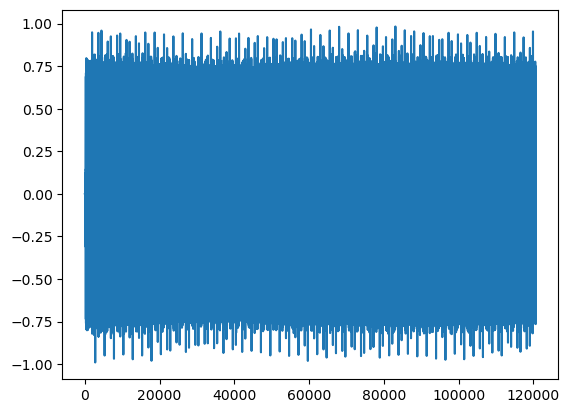

In [7]:
import matplotlib.pyplot as plt

plt.plot(augmented_legitimate[0][0])

/Users/aryannath/Important/RF/rf_signals/recordings_real/honda/model/helpers/fft_gen.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(8.96, 8.96))


OSError: 2408448 requested and 0 written

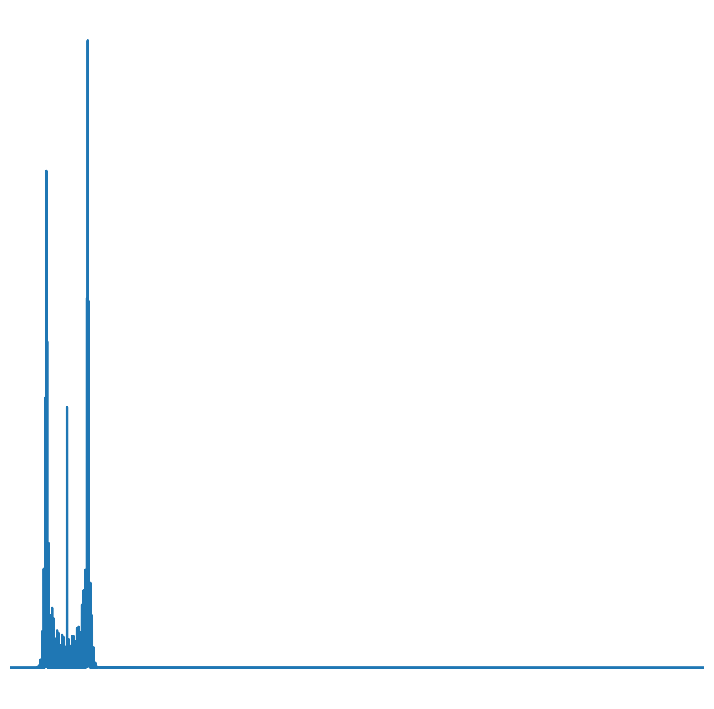

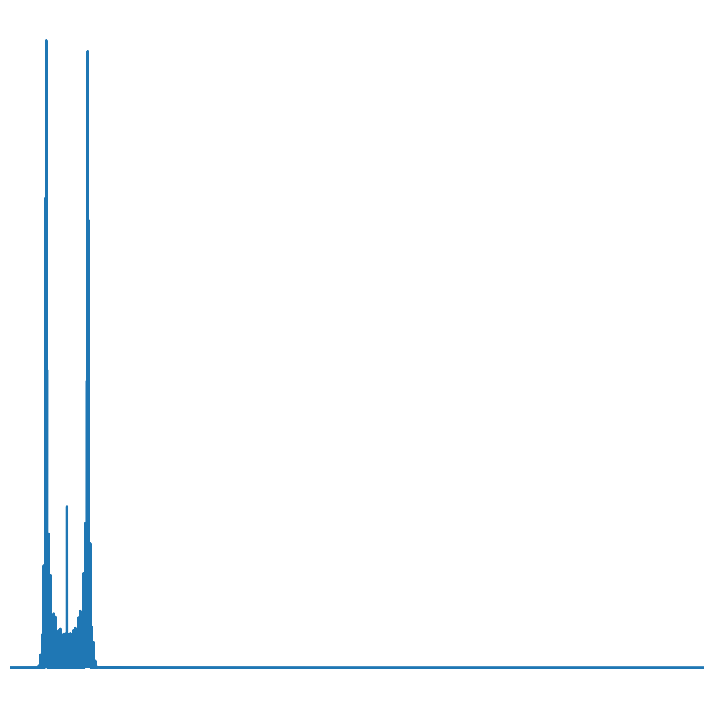

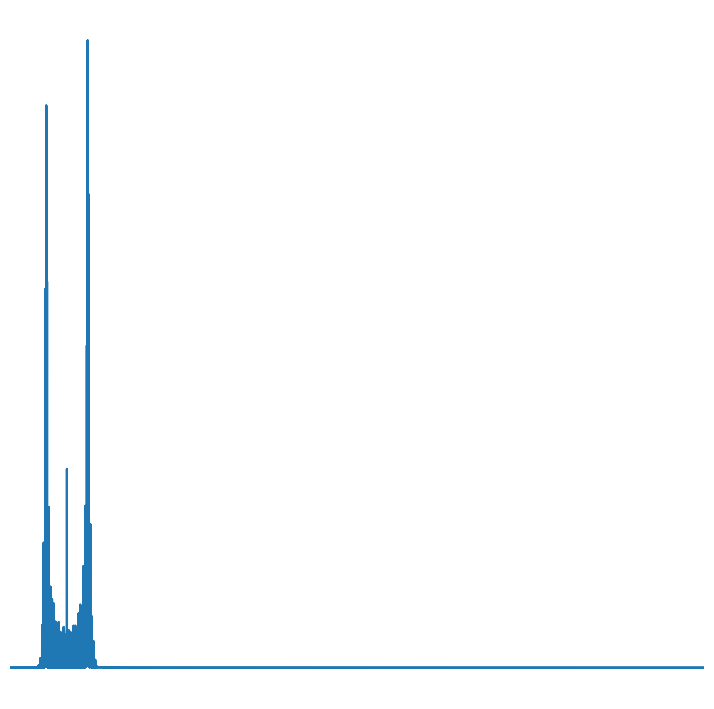

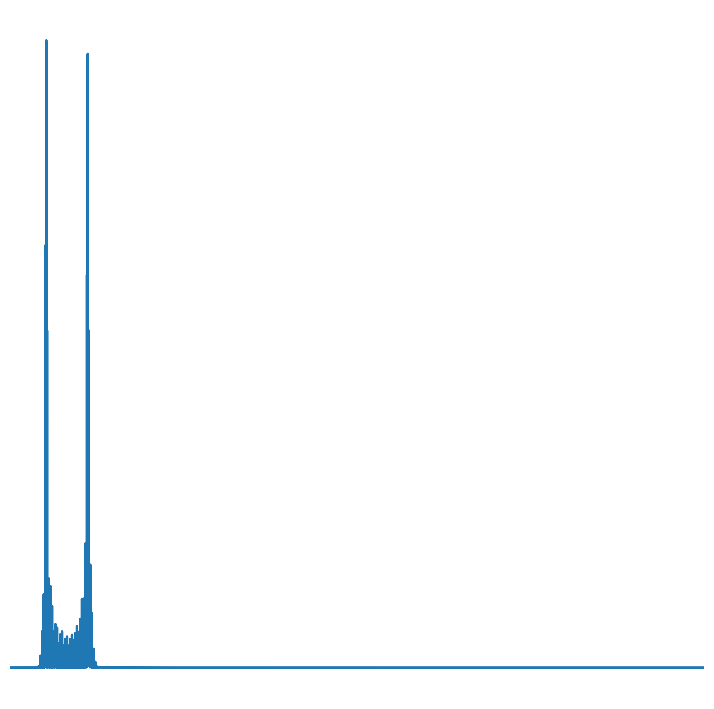

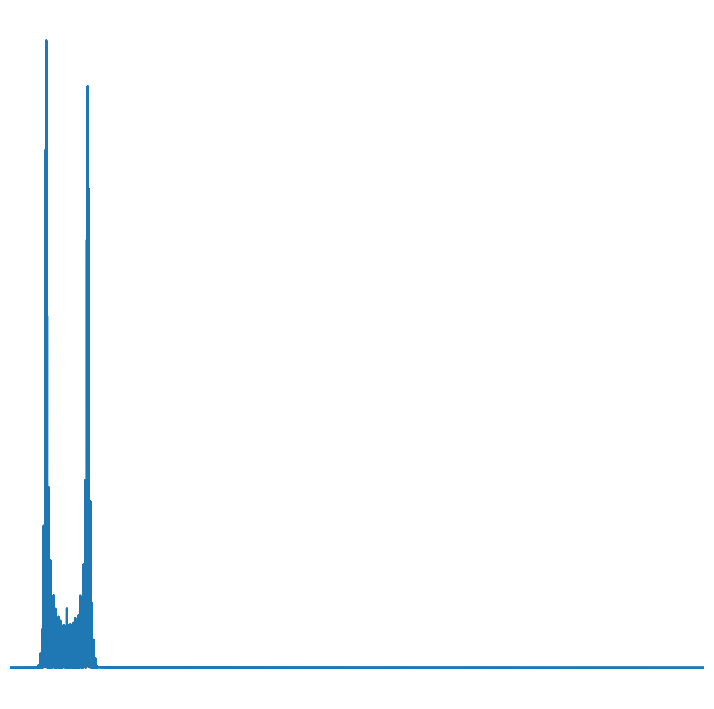

...

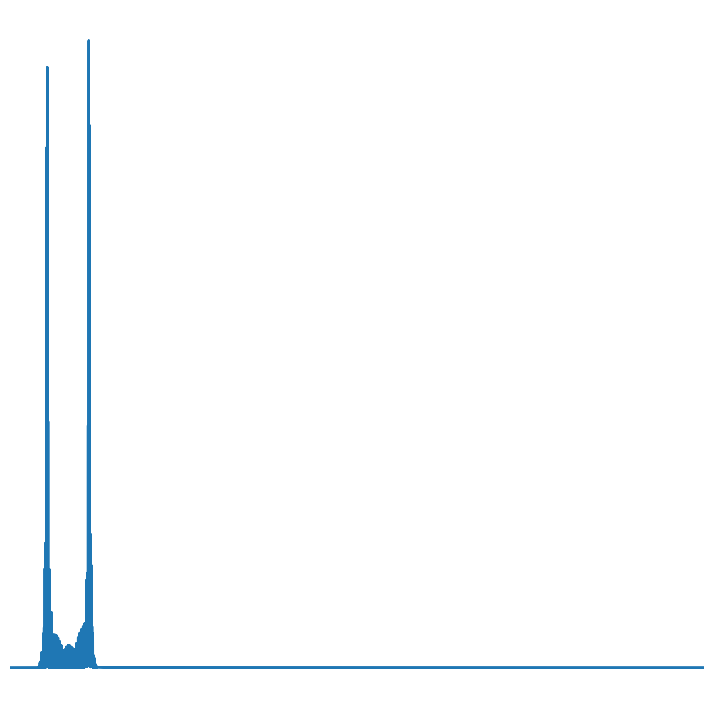

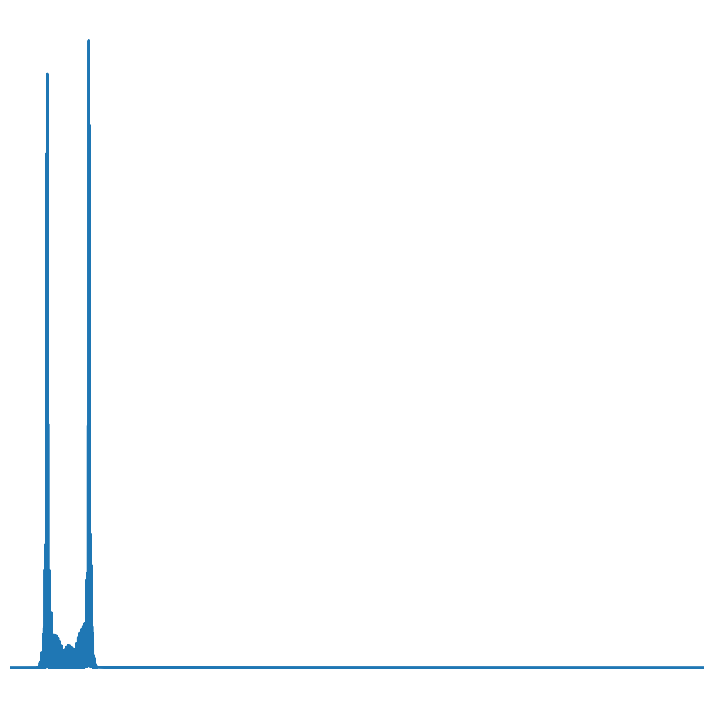

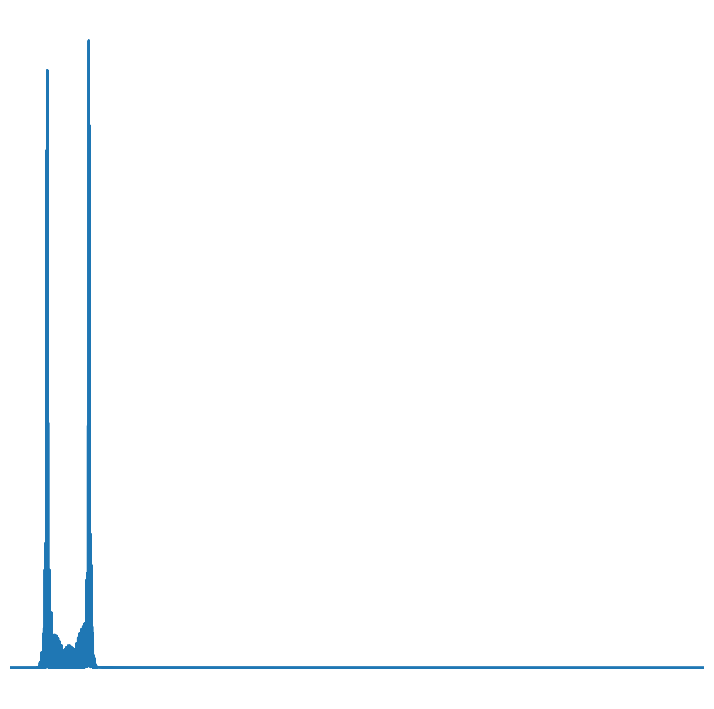

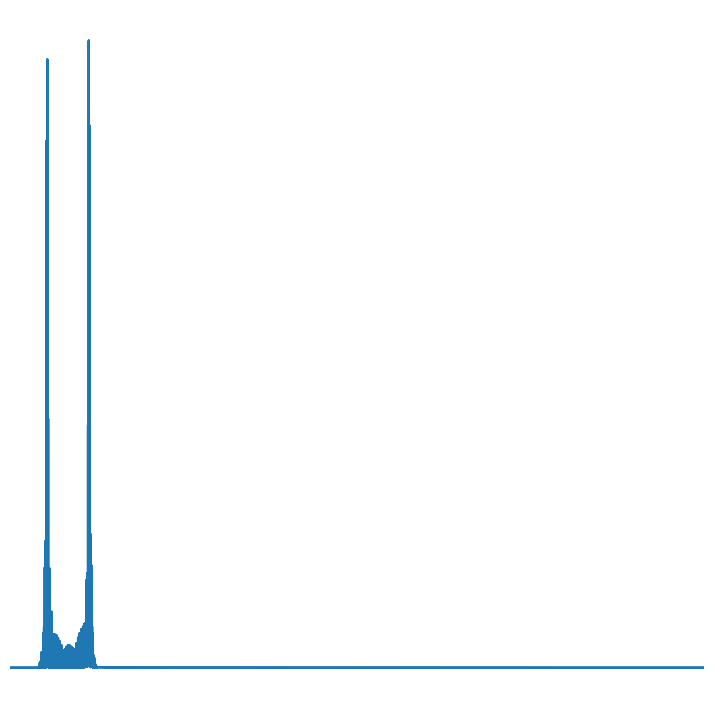

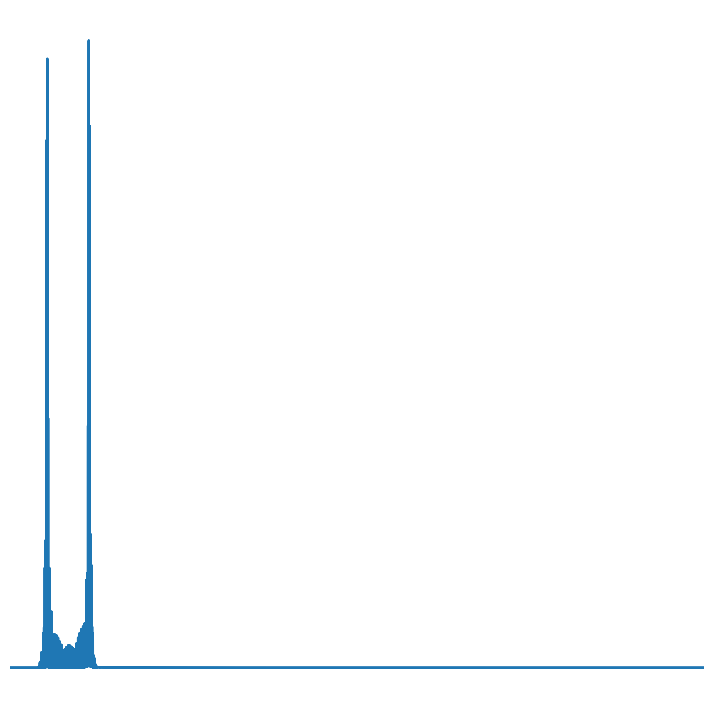

In [8]:
from helpers.fft_gen import gen_fft_dataset

# legitimate_fft = gen_fft_dataset(legitimate)
reconstructed_attack_fft = gen_fft_dataset(reconstructed_attack)
# attack1_fft = gen_fft_dataset(attack1)
# attack2_fft = gen_fft_dataset(attack2)
augmented_legitimate_fft = gen_fft_dataset(augmented_legitimate)

# fft_directory = '../datasets/fft/'
fft_directory = 'datasets/fft/'

# with open(fft_directory + 'legitimate.npy', 'wb') as f:
#     for signal in legitimate_fft:
#         np.save(f, signal[0])

with open(fft_directory + 'reconstructed7.npy', 'wb') as f:
    for signal in reconstructed_attack_fft:
        np.save(f, signal[0])

# with open(fft_directory + 'attack1.npy', 'wb') as f:
#     for signal in attack1_fft:
#         np.save(f, signal[0])

# with open(fft_directory + 'attack2.npy', 'wb') as f:
#     for signal in attack2_fft:
#         np.save(f, signal[0])

with open(fft_directory + 'augmented_legitimate7.npy', 'wb') as f:
    for signal in augmented_legitimate_fft:
        np.save(f, signal[0])


/Users/aryannath/Important/RF/rf_signals/recordings_real/honda/model/helpers/fft_gen.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(8.96, 8.96))


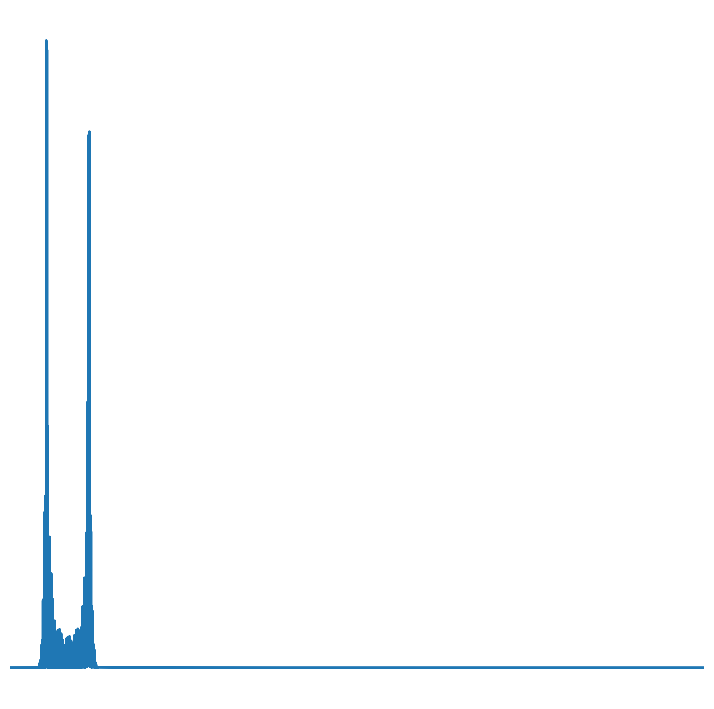

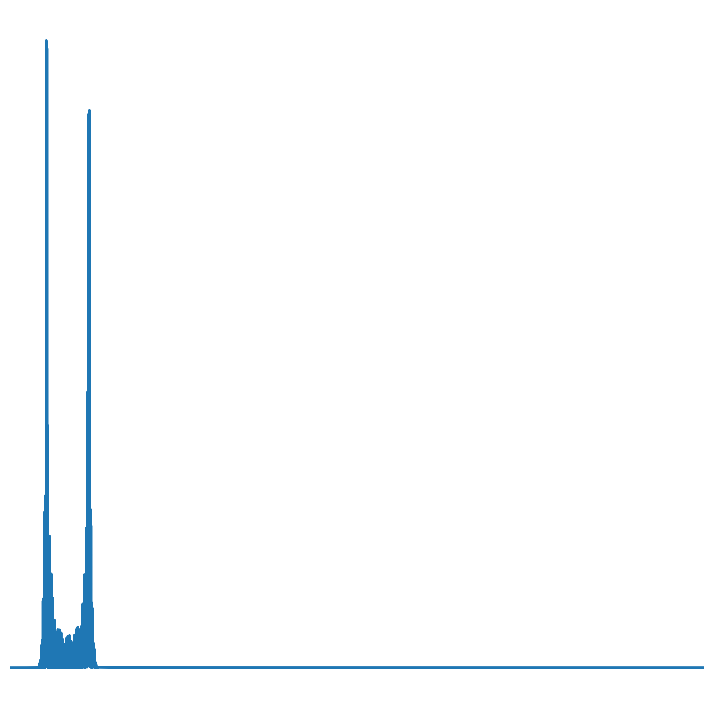

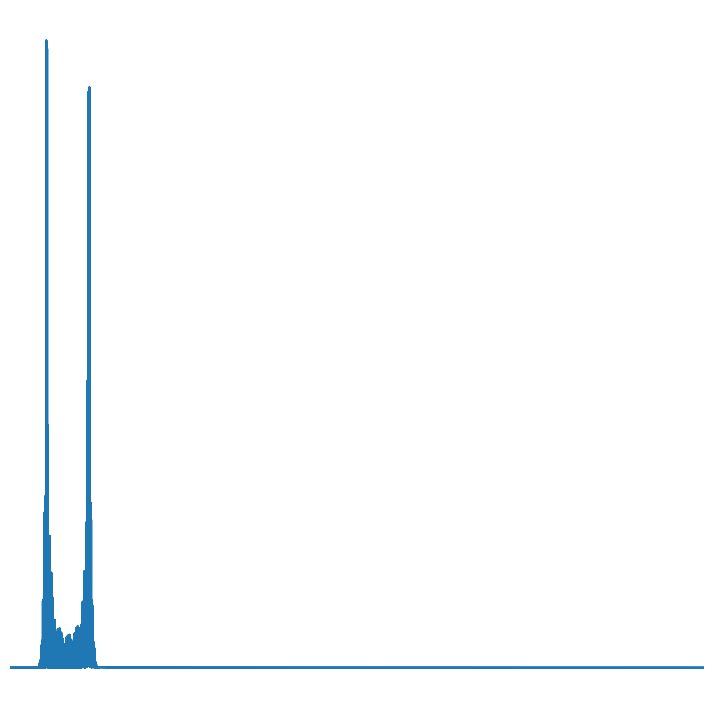

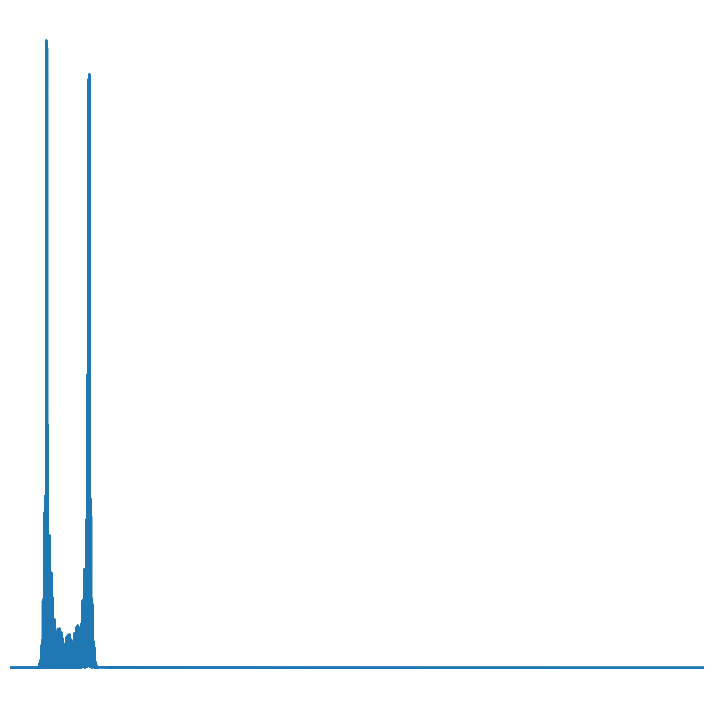

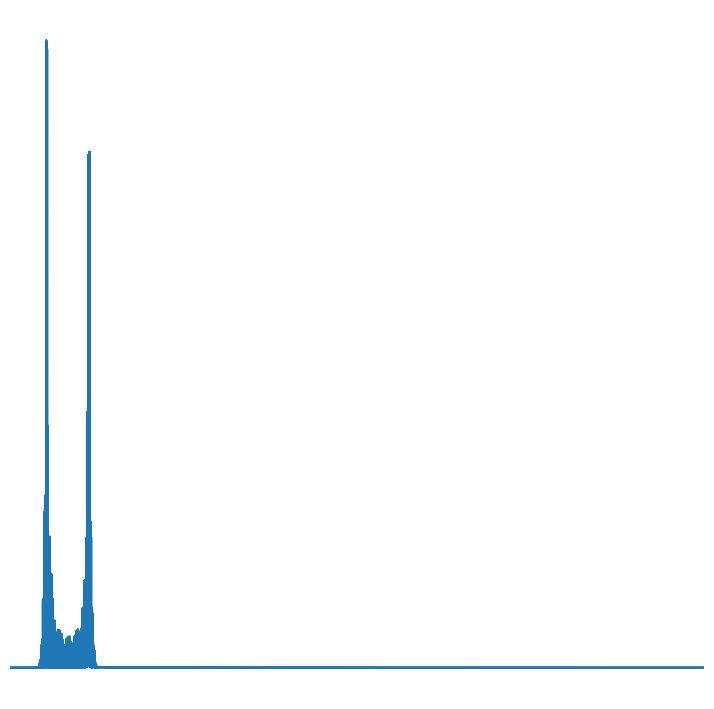

...

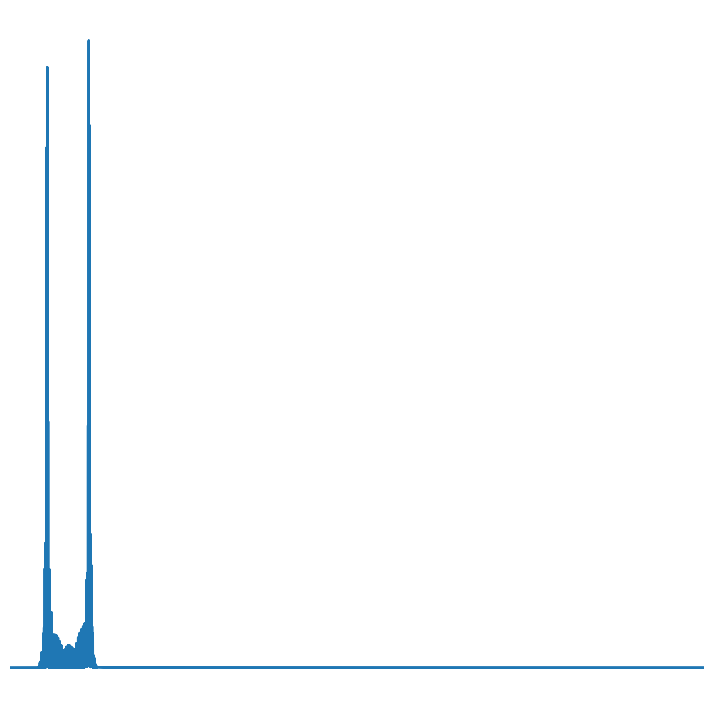

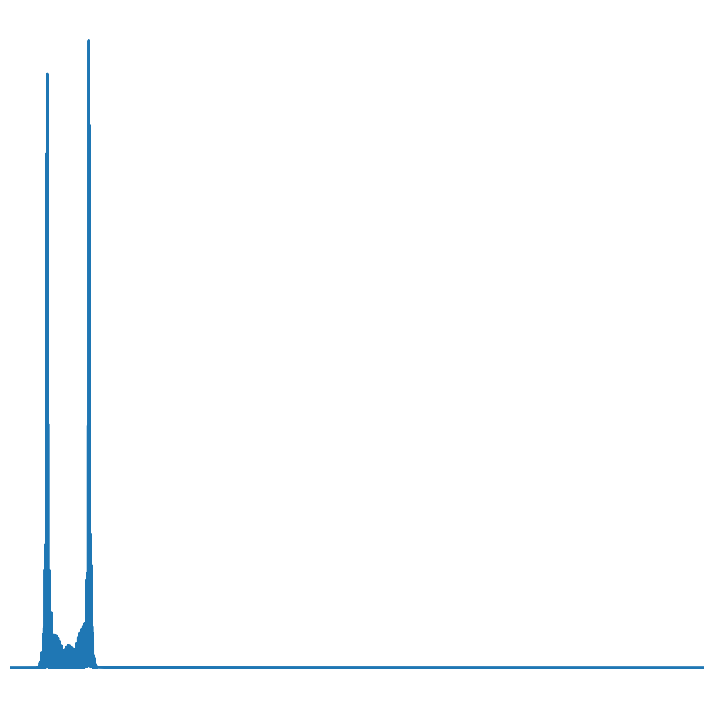

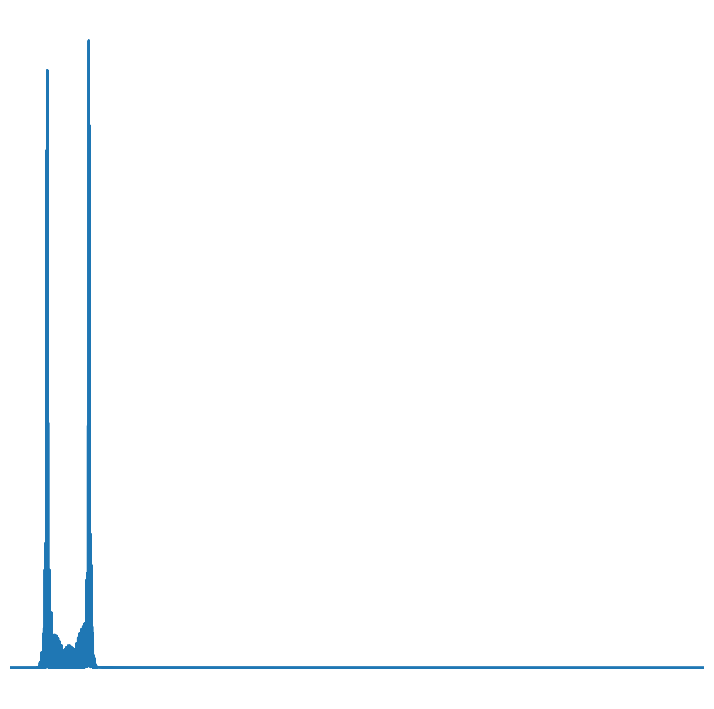

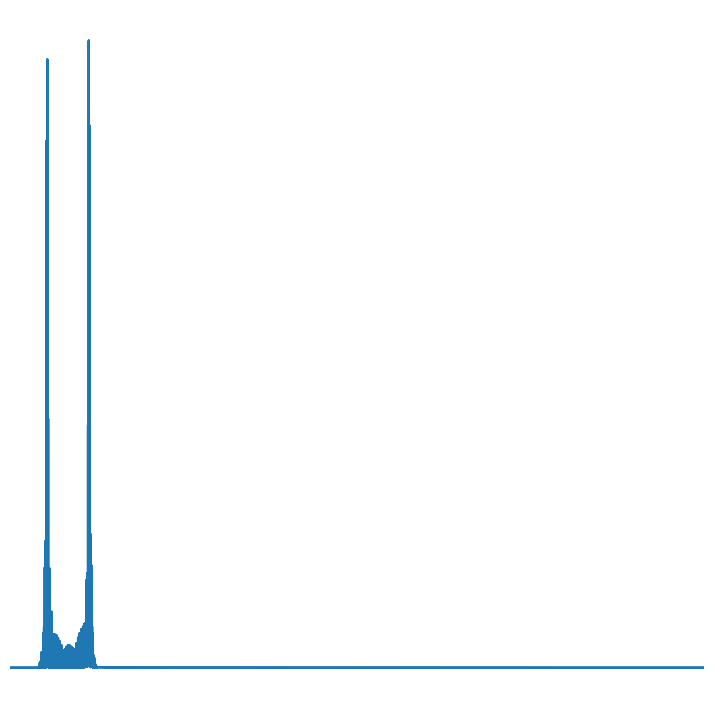

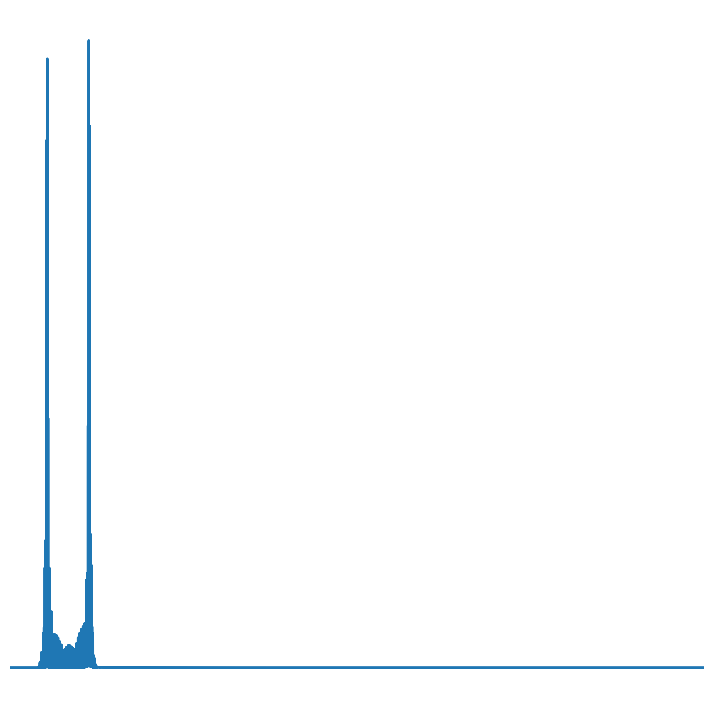

In [12]:
augmented_legitimate_fft = gen_fft_dataset(augmented_legitimate)
with open(fft_directory + 'augmented_legitimate7.npy', 'wb') as f:
    for signal in augmented_legitimate_fft:
        np.save(f, signal[0])